In [1]:
import ultralytics
from ultralytics import YOLO
import numpy as np
# from PIL import Image
# import requests
# from io import BytesIO
import cv2
ultralytics.checks()
import supervision as sv
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline



Ultralytics YOLOv8.0.147 🚀 Python-3.11.4 torch-2.0.1+cpu CPU (13th Gen Intel Core(TM) i7-13700KF)
Setup complete ✅ (24 CPUs, 31.2 GB RAM, 265.0/937.3 GB disk)


In [2]:
# def plot_image(
#     image: np.ndarray, size= (12, 12), cmap = "gray"
# ) -> None:
#     """
#     Plots image using matplotlib.

#     Args:
#         image (np.ndarray): The frame to be displayed.
#         size (Tuple[int, int]): The size of the plot.
#         cmap (str): the colormap to use for single channel images.

#     Examples:
#         ```python
#         >>> import cv2
#         >>> import supervision as sv

#         >>> image = cv2.imread("path/to/image.jpg")

#         %matplotlib inline
#         >>> sv.plot_image(image=image, size=(16, 16))
#         ```
#     """
#     plt.figure(figsize=size)

#     if image.ndim == 2:
#         plt.imshow(image, cmap=cmap)
#     else:
#         plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

#     plt.axis("off")
#     plt.show()

In [2]:
# # Load a model
model = YOLO(
    '/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/notebooks/yolov8n.pt', 
    task='detect') 
# load a pretrained model (recommended for training)


# Load a model
# model = YOLO(
#     "/home/sofia_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/notebooks/yolov8n.pt",
#     task="detect",
# # load a pretrained model (recommended for training)

In [3]:
# load sample image
# sample_img = cv2.imread(
#     "/home/sofia_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/screenshot_samples/Kris_0706-1447.png"
# )

sample_img = '/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/screenshot_samples/Kris_0706-1447.png'

In [5]:
# cv2.destroyAllWindows()

In [15]:
# Utils
# Assuming you have a YOLOv8 model loaded as 'model'
# model = ...


def plot_image(image, size):
    """
    Display the image using matplotlib.

    Parameters:
    - image: Image data.
    - size: Size of the displayed image.
    """
    plt.figure(figsize=size)

    if image.ndim == 2:
        plt.imshow(image, cmap=cmap)
    else:
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    plt.axis("off")
    plt.show()


def predictions(img_path):
    """
    Predict objects in the image using the YOLO model.

    Parameters:
    - img_path: Path to the input image.

    Returns:
    - detections: Detected objects in the image.
    """
    # predictions = model.predict(img, show=True, imgsz=(1253,705))
    # if format == 'RGB':
    #     # Skip the BGR to RGB conversion
    #     pass
    # else:
    #     # Convert from BGR to RGB
    #     img = img[..., ::-1]
    
    
    results = model.predict(img_path)
    # detections = sv.Detections.from_yolov8(predictions[0])
    detections = sv.Detections(
        xyxy=results[0].boxes.xyxy.cpu().numpy(),
        confidence=results[0].boxes.conf.cpu().numpy(),
        class_id=results[0].boxes.cls.cpu().numpy().astype(int),
    )

    return detections


def box_annotate(img, detections):
    """
    Annotate the image with bounding boxes and labels.

    Parameters:
    - img_path: Path to the input image.
    - detections: Detected objects in the image.

    Returns:
    - annotated_image: Image with annotations.
    """

    # dict maping class_id to class_name
    CLASS_NAMES_DICT = model.model.names
    # class_ids of interest - car, motorcycle, bus and truck
    # CLASS_ID = [2, 3, 5, 7]
    CLASS_ID = [2]
    
    if isinstance(img, str):
        # input_data is a path to the image file
        img = cv2.imread(img)
        if img is None:
            raise ValueError(f"Failed to load image from {img}")
    elif isinstance(img, np.ndarray):
        # input_data is a numpy array
        img = img
        
   
    box_annotator = sv.BoxAnnotator(thickness=1, text_thickness=1, text_scale=0.5, text_padding= 1)
    labels = [
        f"{CLASS_NAMES_DICT[class_id]} {confidence:0.2f}"
        for _, confidence, class_id, tracker_id in detections
    ]

    annotated_image = box_annotator.annotate(img, detections=detections, labels=labels)
    
    display_image(title="img", image=img, size=(16, 16))

    return annotated_image


def enhance_image(image):
    """
    Enhance the given image using various techniques and display each step.

    Parameters:
    - image_path: Path to the input image.
    """

    # Load the image
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib
    # display_image('Original Image', image)

    # Convert to Grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # display_image('Grayscale Image', gray)

    # Histogram Equalization
    equalized = cv2.equalizeHist(gray)
    # display_image('Histogram Equalized Image', equalized)

    # Adaptive Histogram Equalization (CLAHE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    clahe_img = clahe.apply(gray)

    display_image('CLAHE Image', clahe_img)

    return clahe_img


def display_image(title, image, size=(16, 16)):
    plt.figure(figsize=size)
    plt.imshow(image, cmap="gray")
    plt.title(title)
    plt.axis("off")
    plt.show()


def enhance_image_rgb(image, size):
    """
    Enhance the given image using various techniques and display each step.

    Parameters:
    - image: Input image.
    """

    # Convert the image to RGB (if it's in BGR format due to OpenCV)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Split the image into its color channels
    r, g, b = cv2.split(image)

    # Apply CLAHE to each channel
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    r_clahe = clahe.apply(r)
    g_clahe = clahe.apply(g)
    b_clahe = clahe.apply(b)

    # Merge the channels back together
    clahe_img = cv2.merge([r_clahe, g_clahe, b_clahe])

    plot_image(clahe_img, size)

    return clahe_img


image 1/1 /home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/screenshot_samples/Kris_0706-1447.png: 384x640 26 cars, 19.6ms
Speed: 1.1ms preprocess, 19.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


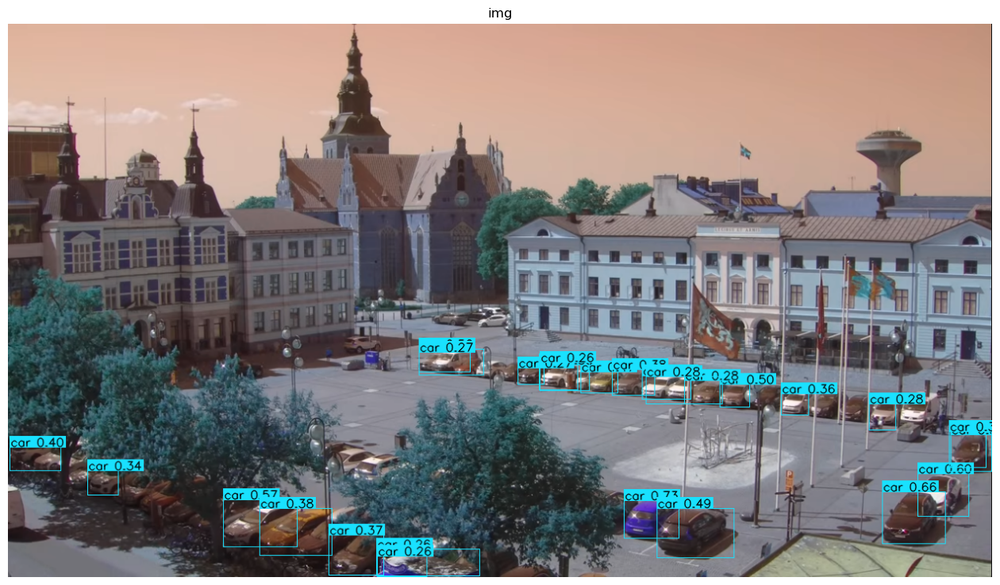

In [16]:
sample_img = '/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/screenshot_samples/Kris_0706-1447.png'

# sample_img = '/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/eval_subset_samples/Slaughterhouse-0508-2016.png'

# sample_img = '/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/eval_subset_samples/Varbergs-2610-1436.png'

# sample_img= '/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/eval_subset_samples/Slaughterhouse-0308-2111.png'

# sample_img= '/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/eval_subset_samples/Slaughterhouse-3010-1142.png'

detections = predictions(sample_img)
annotated = box_annotate(sample_img, detections)

The resolution of the image is 1253x705
The resolution of the cropped image is 1200x305


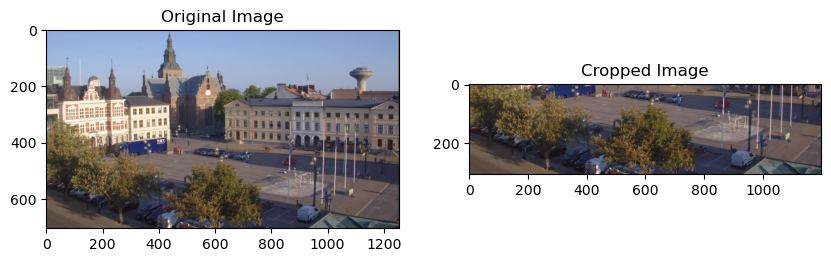

In [138]:
# cropping
# might need diff paramerters for each area - start with kris


# Load the image
sample_img_path = cv2.imread(
    "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/screenshot_samples/Kris_0706-0611.png"
)

# Get the resolution
height, width, _ = sample_img_path.shape

print(f"The resolution of the image is {width}x{height}")

# OpenCV reads images in BGR format, we convert it to RGB to display it with correct colors
img_rgb = cv2.cvtColor(sample_img_path, cv2.COLOR_BGR2RGB)

# Define the region of interest (ROI)
# The format is img[y:y+h, x:x+w]
y = 400
h = 500
x = 0
w = 1200
crop_img_rgb = img_rgb[
    y : y + h, x : x + w
]  # This will crop the image at (x, y) = (100, 50) with width 200 and height 150

# Convert cropped image to RGB
# crop_img_rgb = cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB)

# Get the resolution
height, width, _ = crop_img_rgb.shape

print(f"The resolution of the cropped image is {width}x{height}")

# Display the original and cropped image side by side
plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(crop_img_rgb)
plt.title("Cropped Image")

plt.show()

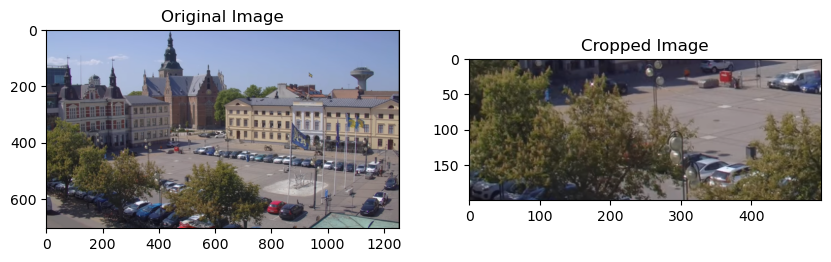

In [17]:


def process_and_display_image(img_path, x, y, w, h, display_original=True, display_cropped=True):
    """
    Load an image, crop it, and display the original and cropped images.

    Parameters:
    - img_path: Path to the input image.
    - x, y: Coordinates for the top-left corner of the cropping rectangle.
    - w, h: Width and height of the cropping rectangle.
    - display_original: Whether to display the original image.
    - display_cropped: Whether to display the cropped image.
    """
    # Load the image
    img = cv2.imread(img_path)
    if img is None:
        raise ValueError(f"Failed to load image from {img_path}")

    # Convert to RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Crop the image
    crop_img = img[y:y+h, x:x+w]
    crop_img_rgb = cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB)

    # Display the images
    if display_original or display_cropped:
        plt.figure(figsize=(10, 5))

    if display_original:
        plt.subplot(1, 2, 1)
        plt.imshow(img_rgb)
        plt.title('Original Image')

    if display_cropped:
        plt.subplot(1, 2, 2)
        plt.imshow(crop_img_rgb)
        plt.title('Cropped Image')

    plt.show()


    return crop_img_rgb

# crop_img_rgb = process_and_display_image(sample_img, x=0, y=400, w=1200, h=500)

crop_img_rgb = process_and_display_image(sample_img, x=100, y=400, w=500, h=200)


0: 256x640 1 traffic light, 78.5ms
Speed: 0.7ms preprocess, 78.5ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 640)


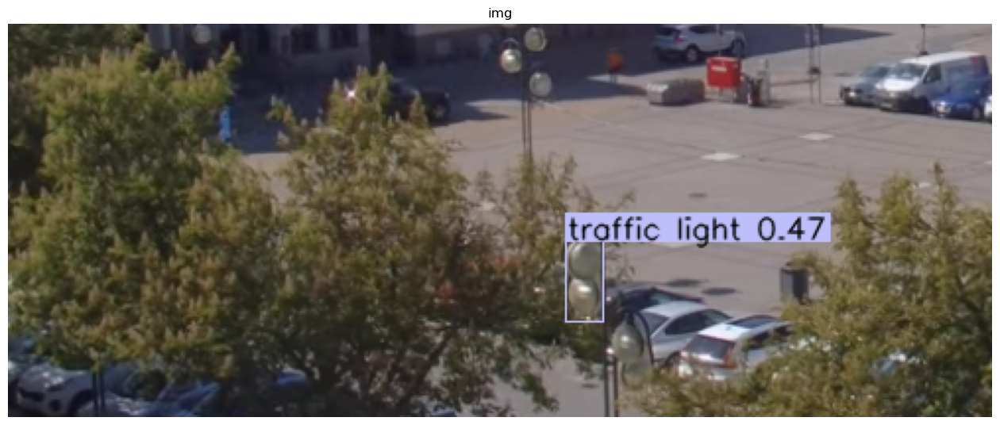

In [18]:
detections = predictions(crop_img_rgb)
annotated = box_annotate(crop_img_rgb, detections)


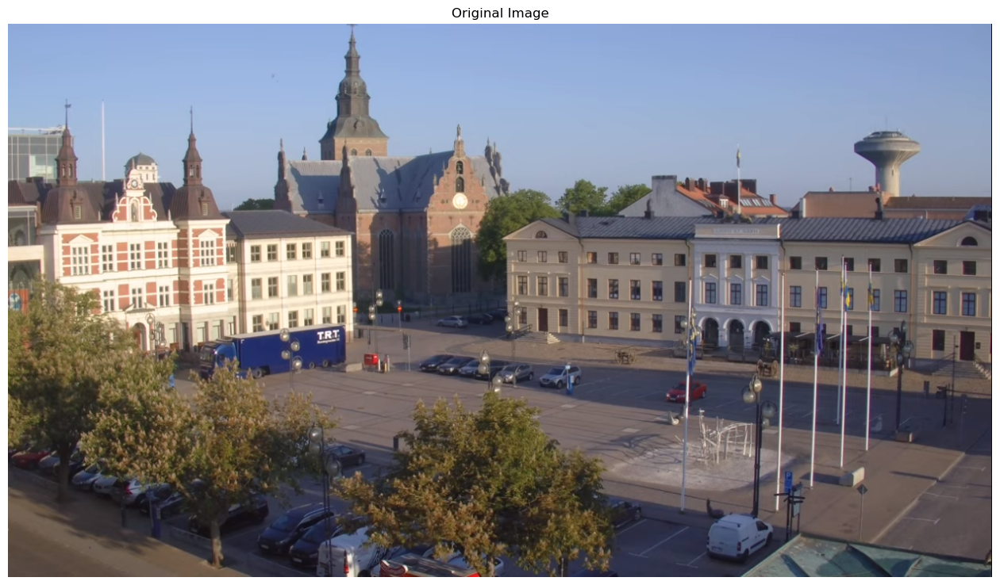

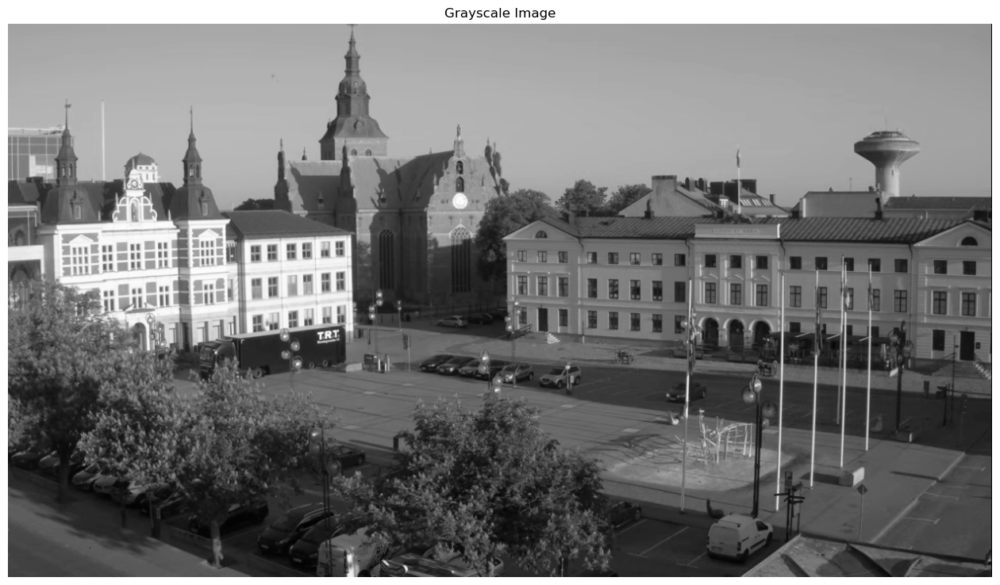

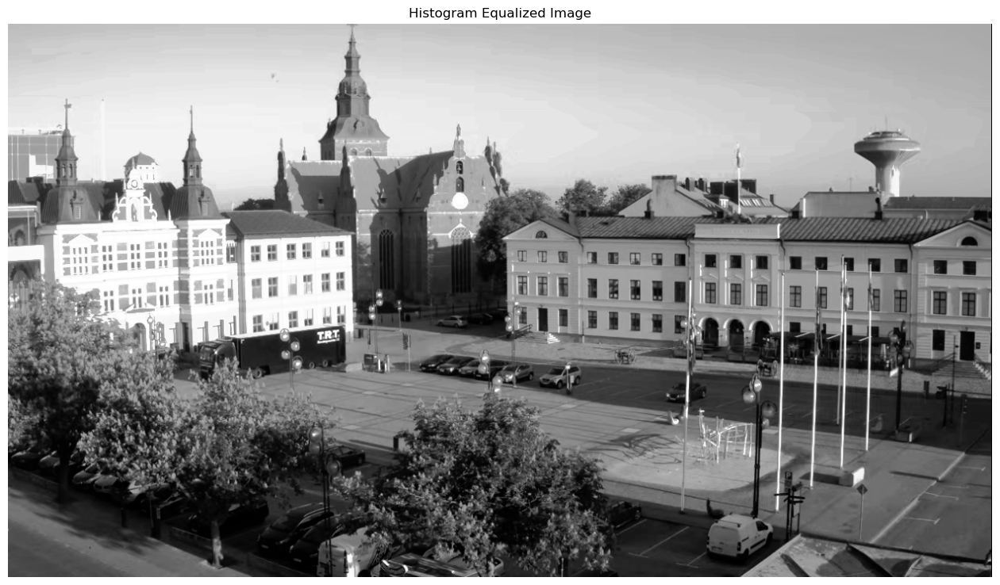

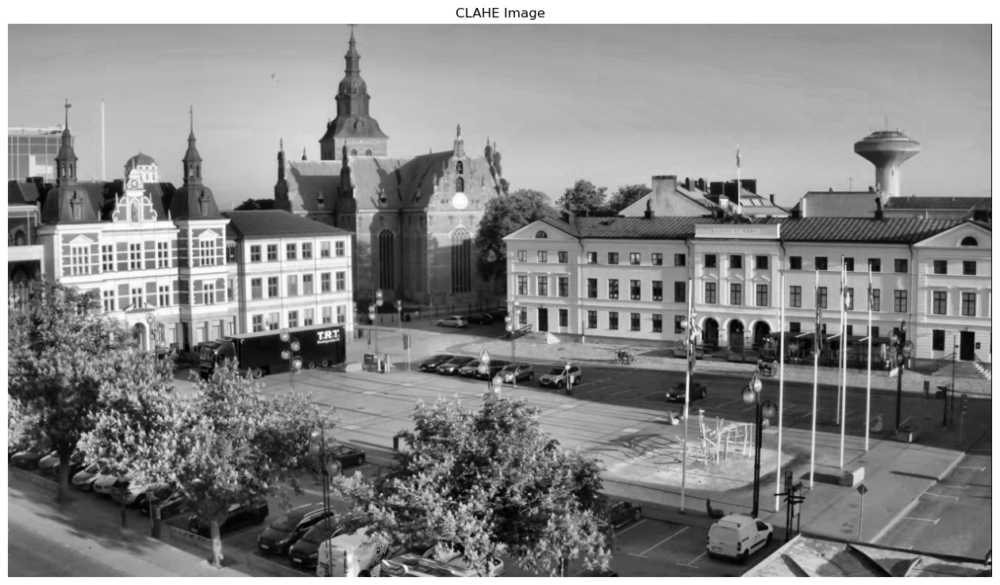

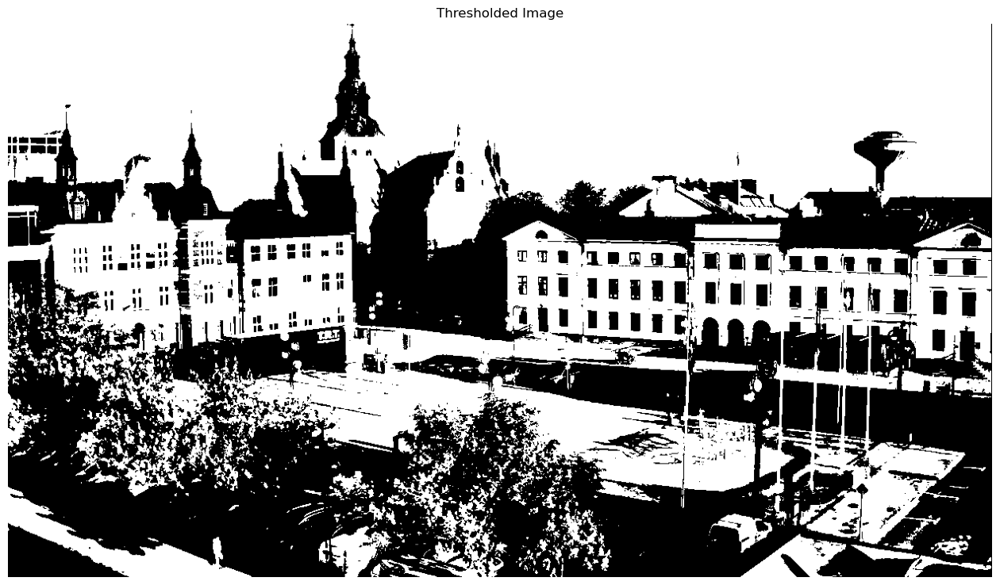

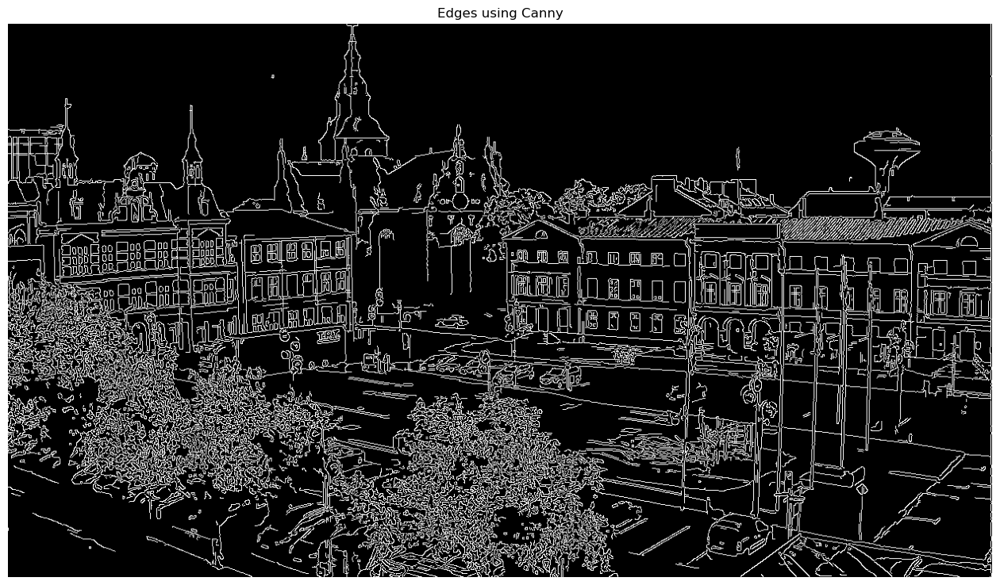

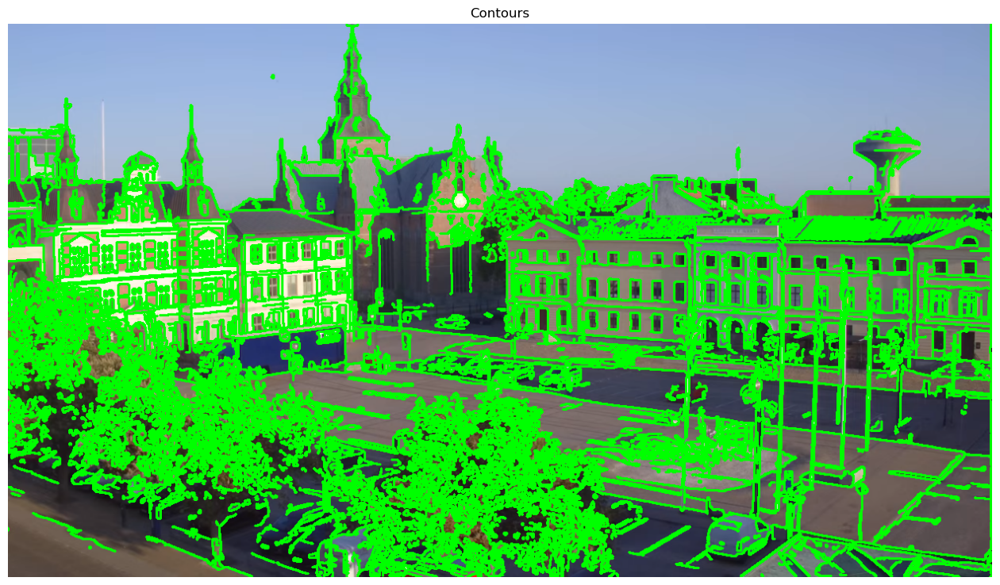

In [32]:
# Load the image
image_path = "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/screenshot_samples/Kris_0706-0611.png"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib
display_image('Original Image', image)

# Convert to Grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
display_image('Grayscale Image', gray)

# Histogram Equalization
equalized = cv2.equalizeHist(gray)
display_image('Histogram Equalized Image', equalized)

# Adaptive Histogram Equalization (CLAHE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(gray)
display_image('CLAHE Image', clahe_img)

# Thresholding
ret, thresh = cv2.threshold(clahe_img, 127, 255, cv2.THRESH_BINARY)
display_image('Thresholded Image', thresh)

# Edge Detection using Canny
edges = cv2.Canny(clahe_img, 100, 200)
display_image('Edges using Canny', edges)

# Find Contours
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_img = image.copy()
cv2.drawContours(contour_img, contours, -1, (0,255,0), 2)
display_image('Contours', contour_img)


0: 736x1280 1 person, 7 cars, 1 truck, 1 clock, 75.9ms
Speed: 3.2ms preprocess, 75.9ms inference, 0.9ms postprocess per image at shape (1, 3, 736, 1280)


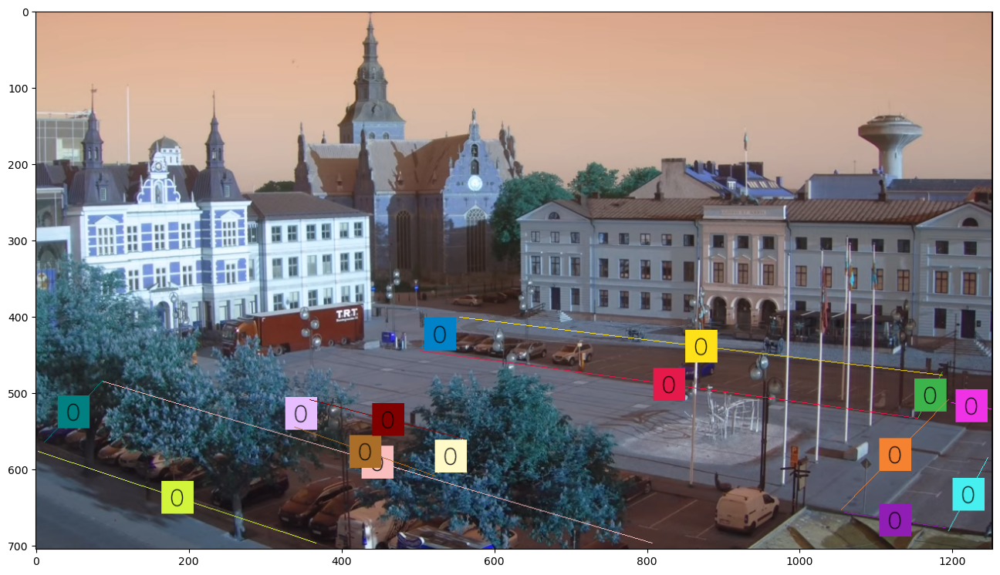

In [54]:
# initiate polygon zone
polygons = [
np.array([
[503, 445],[1155, 533]
]),np.array([
[1155, 533],[1187, 473]
]),np.array([
[1187, 477],[555, 401]
]),np.array([
[555, 405],[503, 441]
]),np.array([
[1195, 509],[1055, 653]
]),np.array([
[1059, 657],[1191, 677]
]),np.array([
[1195, 681],[1247, 585]
]),np.array([
[1199, 513],[1251, 521]
]),np.array([
[3, 577],[367, 697]
]),np.array([
[807, 697],[87, 485]
]),np.array([
[87, 485],[11, 565]
]),np.array([
[355, 509],[339, 545]
]),np.array([
[339, 545],[523, 609]
]),np.array([
[527, 605],[559, 561]
]),np.array([
[563, 561],[359, 509]
])
]

colors = sv.ColorPalette.default()

# Get the resolution
height, width, channels = image.shape

# print(f"Width: {width}, Height: {height}")

zones = [
    sv.PolygonZone(
        polygon=polygon,
        frame_resolution_wh=(width,height)
    )
    for polygon
    in polygons
]
zone_annotators = [
    sv.PolygonZoneAnnotator(
        zone=zone,
        color=colors.by_idx(index),
        thickness=1,
        text_thickness=1,
        text_scale=1
    )
    for index, zone
    in enumerate(zones)
]
box_annotators = [
    sv.BoxAnnotator(
        color=colors.by_idx(index),
        thickness=4,
        text_thickness=4,
        text_scale=1
        )
    for index
    in range(len(polygons))
]

def process_frame(frame: np.ndarray, i) -> np.ndarray:
    results = model(frame, imgsz=1280)[0]
    detections = sv.Detections.from_yolov8(results)

    for zone, zone_annotator, box_annotator in zip(zones, zone_annotators, box_annotators):
        mask = zone.trigger(detections=detections)
        detections_filtered = detections[mask]
        frame = box_annotator.annotate(scene=frame, detections=detections_filtered, skip_label=False)
        frame = zone_annotator.annotate(scene=frame)

    return frame

try:
    results = model(image, imgsz=1280)[0]
    detections = sv.Detections.from_yolov8(results)

    for zone, zone_annotator, box_annotator in zip(zones, zone_annotators, box_annotators):
        mask = zone.trigger(detections=detections)
        detections_filtered = detections[mask]
        frame = box_annotator.annotate(scene=image, detections=detections_filtered)
        frame = zone_annotator.annotate(scene=frame)

    %matplotlib inline
    sv.show_frame_in_notebook(frame, (16, 16))

except Exception as e:
    print(f"Error: {e}")


0: 384x640 (no detections), 43.2ms
Speed: 1.5ms preprocess, 43.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


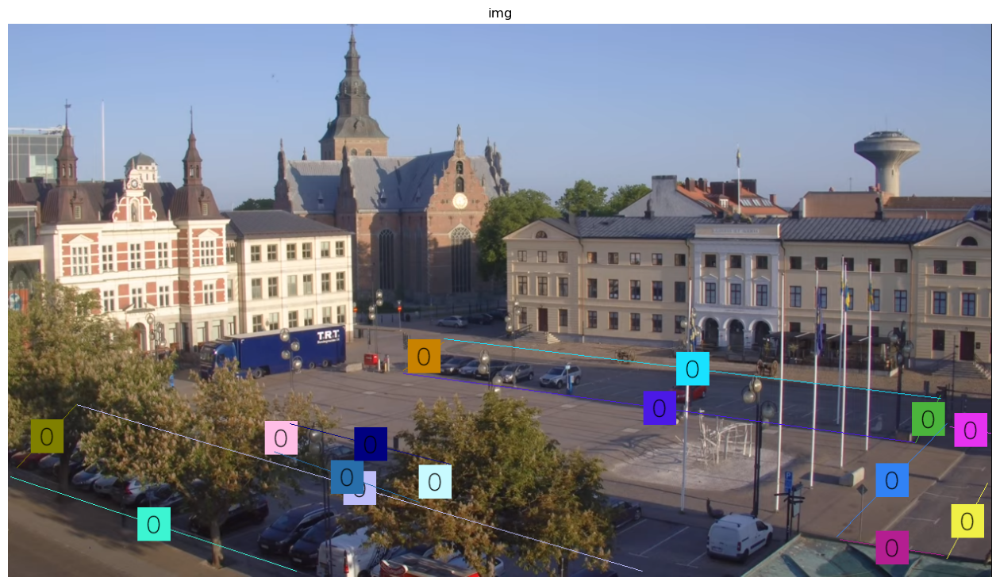

In [57]:
detections = predictions(frame)
annotated = box_annotate(frame, detections)

In [69]:
# dict maping class_id to class_name
CLASS_NAMES_DICT = model.model.names
# class_ids of interest - car, motorcycle, bus and truck
CLASS_ID = [2]


def display_image(title, image, size=(16, 16)):
    plt.figure(figsize=size)
    plt.imshow(image, cmap="gray")
    plt.title(title)
    plt.axis("off")
    plt.show()


# create instance of BoxAnnotator
box_annotator = sv.BoxAnnotator(thickness=1, text_thickness=1, text_scale=0.5)

frame = image
# model prediction on single frame and conversion to supervision Detections
results = model.predict(frame, conf=0.2)
detections = sv.Detections(
    xyxy=results[0].boxes.xyxy.cpu().numpy(),
    confidence=results[0].boxes.conf.cpu().numpy(),
    class_id=results[0].boxes.cls.cpu().numpy().astype(int),
)

detections = detections[detections.class_id == 2]
# format custom labels
labels = [
    f"{CLASS_NAMES_DICT[class_id]} {confidence:0.2f}"
    for _, confidence, class_id, tracker_id in detections
]
# annotate and display frame
frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)

# %matplotlib inline
# show_frame_in_notebook(frame, (16, 16))


0: 384x640 (no detections), 19.7ms
Speed: 1.0ms preprocess, 19.7ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)


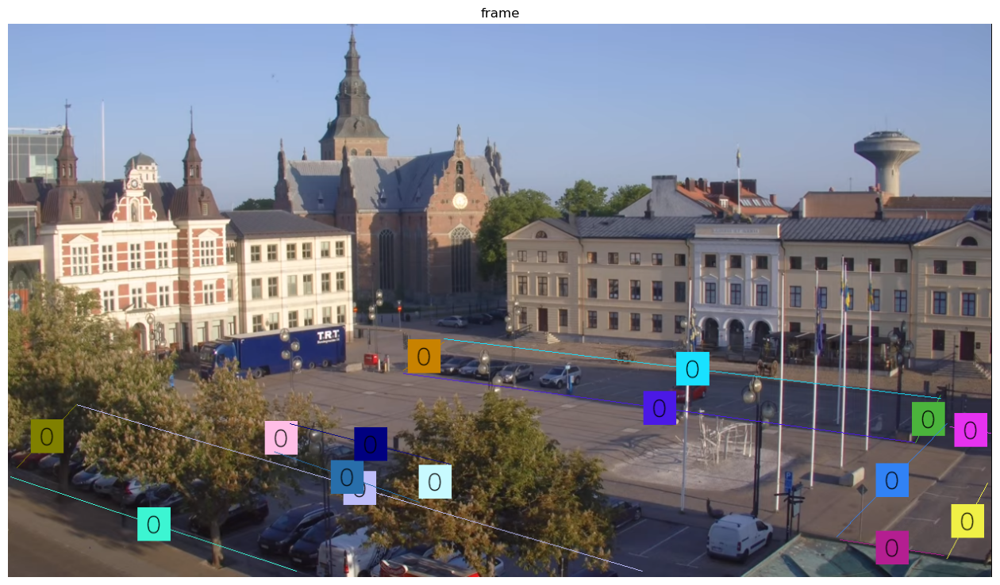

In [70]:
display_image("frame", frame, size=(16, 16))